In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

from sklearn.preprocessing import MinMaxScaler
from feature_engine.wrappers import SklearnTransformerWrapper
from sklearn.model_selection import train_test_split

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

# linear classification model
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
# non-linear classification model
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier 


import warnings
from sklearn.exceptions import DataConversionWarning
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)
warnings.filterwarnings("ignore")

### Exploratory data Analysis

In [54]:
# import dataset 
data = pd.read_csv("Data/mobile_price_classification.csv")

In [55]:
profile = ProfileReport(df=data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

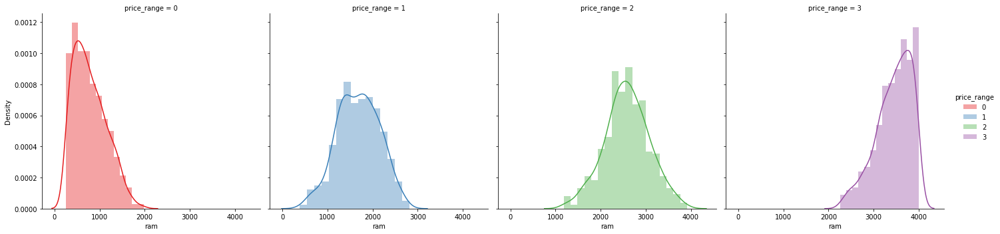

In [56]:
g = sns.FacetGrid(data, col="price_range", 
                  hue="price_range", 
                  palette="Set1",
                  height=5
                   )
g = (g.map(sns.distplot, "ram").add_legend())

In [57]:
# there are 4 types range prices
# Type 1: RAM ranges between 0 to 2000 megabytes
# Type 2: RAM ranges between 0 to 3000 megabytes
# Type 3: RAM ranges between 1000 to 4000 megabytes
# Type 4: RAM ranges between 2000 to 4000 megabytes

In [58]:
categorical_features = ['blue', 'dual_sim', 'four_g', 'three_g', 'wifi', 'price_range']
continous_features = [feature for feature in data.columns if feature not in categorical_features]
print('Categorical features: ', categorical_features)
print('Continous features: ', continous_features)

Categorical features:  ['blue', 'dual_sim', 'four_g', 'three_g', 'wifi', 'price_range']
Continous features:  ['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'touch_screen']


In [59]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

results = []

for continous_feature in continous_features: 
    model = ols('{} ~ price_range'.format(continous_feature),                 # Model formula
                data = data[[continous_feature,'price_range']]).fit()

    anova_result = sm.stats.anova_lm(model, typ=2)
    if(anova_result['PR(>F)']['price_range'] < 0.05):
        print('{} vs price_range feature have PR(>F): {}'.format(continous_feature, anova_result['PR(>F)']['price_range']))
        results.append(continous_feature)

battery_power vs price_range feature have PR(>F): 1.2648542392210857e-19
int_memory vs price_range feature have PR(>F): 0.046930062434568154
px_height vs price_range feature have PR(>F): 2.2278061308117358e-11
px_width vs price_range feature have PR(>F): 8.478968798288293e-14
ram vs price_range feature have PR(>F): 0.0


In [60]:
# các biến liên tục ảnh hưởng đến price_range: battery_power, px_height, px_width, ram, int_memory

<AxesSubplot:>

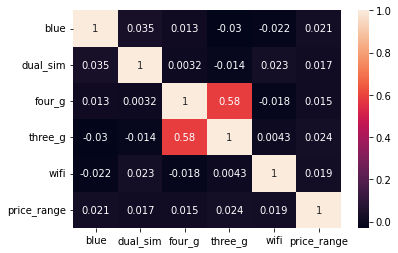

In [61]:
sns.heatmap(data = data[categorical_features].corr(),
            annot=True)

In [62]:
# các biến phân loại có độ tương quan thấp với price_range

In [63]:
# Create the scaler
mm = SklearnTransformerWrapper(MinMaxScaler(feature_range=(0,1)))

# split data into training and test sets
X = data[results].copy()
y = data['price_range'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.3)

X_train = mm.fit_transform(X_train)
X_test = mm.transform(X_test)

In [64]:
def visualization_ram_battery_price(X, y):
    y = pd.Series(y, index=None, name='price_range')
    df = pd.concat([X, y], axis=1)
    g = sns.FacetGrid(data,hue = 'price_range', height = 5)
    g.map(plt.scatter, 'ram','battery_power',alpha = 0.6)
    g.add_legend()

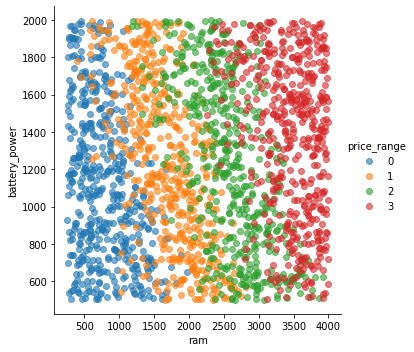

In [65]:
visualization_ram_battery_price(X, y)

### Model Selection

In [66]:
from datetime import datetime

models = [
    LogisticRegression(multi_class='multinomial'),
    SVC(),
    KNeighborsClassifier(n_neighbors=4),
    DecisionTreeClassifier(max_depth=6),
    RandomForestClassifier(n_estimators=100),
    GaussianNB()
]

model_selection = pd.DataFrame(columns=[
    'model',
    'parameters',
    'accuracy',
    'Duration'
])

for model in models:
    # Get name model
    model_name = model.__class__.__name__
    # Get current time
    start_time = datetime.now()
    # Get the cross validation accuracy score
    scores = cross_val_score(model, X_train, y_train, cv=10, n_jobs=-1)
    # Get the current time
    end_time = datetime.now()
    
    time_taken = end_time - start_time
    
    model_selection = model_selection.append({
        'model':model_name,
        'parameters': model.get_params(),
        'accuracy': scores.mean(),
        'Duration': time_taken
    }, ignore_index=True)

In [67]:
model_selection.sort_values(by='accuracy',ascending=False)

,model,parameters,accuracy,Duration
1,SVC,"{'C': 1.0, 'break_ties': False, 'cache_size': ...",0.933571,0 days 00:00:00.618064
0,LogisticRegression,"{'C': 1.0, 'class_weight': None, 'dual': False...",0.925000,0 days 00:00:00.763180
4,RandomForestClassifier,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",0.904286,0 days 00:00:04.241333
2,KNeighborsClassifier,"{'algorithm': 'auto', 'leaf_size': 30, 'metric...",0.826429,0 days 00:00:02.206540
3,DecisionTreeClassifier,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",0.824286,0 days 00:00:00.290448
5,GaussianNB,"{'priors': None, 'var_smoothing': 1e-09}",0.801429,0 days 00:00:00.072987


In [68]:
model_selection.sort_values(by='Duration',ascending=True)

,model,parameters,accuracy,Duration
5,GaussianNB,"{'priors': None, 'var_smoothing': 1e-09}",0.801429,0 days 00:00:00.072987
3,DecisionTreeClassifier,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",0.824286,0 days 00:00:00.290448
1,SVC,"{'C': 1.0, 'break_ties': False, 'cache_size': ...",0.933571,0 days 00:00:00.618064
0,LogisticRegression,"{'C': 1.0, 'class_weight': None, 'dual': False...",0.925000,0 days 00:00:00.763180
2,KNeighborsClassifier,"{'algorithm': 'auto', 'leaf_size': 30, 'metric...",0.826429,0 days 00:00:02.206540
4,RandomForestClassifier,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",0.904286,0 days 00:00:04.241333


In [69]:
# SVC có độ chính xác cao nhất và thời gian tương tối nhanh

In [70]:
# Calculate the accuracy of the model 
def calculate_accuracy(X_train, Y_train, X_test, Y_test, model):
    kf = KFold(n_splits=100)
    accuracys = cross_val_score(model, X_train, Y_train, cv=kf)
    print("Average accuracy: ", accuracys.mean(), "+/-", accuracys.std())
    print('-'*50)
    print('The training predictions accuracy:', model.score(X_train, y_train))
    print('The testing predictions accuracy:', model.score(X_test, y_test))
    print('='*50)
    print('Confusion matrix')
    print(classification_report(y_test, model.predict(X_test)))

### Logistic regression

In [71]:
from sklearn.model_selection import GridSearchCV

In [72]:
para_grid = {
    'penalty':['l1', 'l2', 'elasticnet', None],
    'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'multi_class':['ovr','multinomial']
}

clf = GridSearchCV(estimator=LogisticRegression(), param_grid=para_grid, cv=10, n_jobs=-1)
clf.fit(X_train, y_train)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was

GridSearchCV(cv=10, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'multi_class': ['ovr', 'multinomial'],
                         'penalty': ['l1', 'l2', 'elasticnet', None],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']})

In [73]:
print('the best parameter: ', clf.best_params_)

the best parameter:  {'multi_class': 'multinomial', 'penalty': 'l1', 'solver': 'saga'}


In [74]:
# Create the logistic regression model
log = LogisticRegression(**clf.best_params_)

# Train the logistic regression model
log.fit(X_train, y_train)

LogisticRegression(multi_class='multinomial', penalty='l1', solver='saga')

In [75]:
calculate_accuracy(X_train, y_train, X_test, y_test, log)

Average accuracy:  0.9550000000000002 +/- 0.05592907315958129
--------------------------------------------------
The training predictions accuracy: 0.9578571428571429
The testing predictions accuracy: 0.96
Confusion matrix
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       151
           1       0.93      0.99      0.96       146
           2       0.95      0.92      0.93       148
           3       0.96      0.96      0.96       155

    accuracy                           0.96       600
   macro avg       0.96      0.96      0.96       600
weighted avg       0.96      0.96      0.96       600



In [76]:
# the model with high accuracy 
# balanced recall and precision

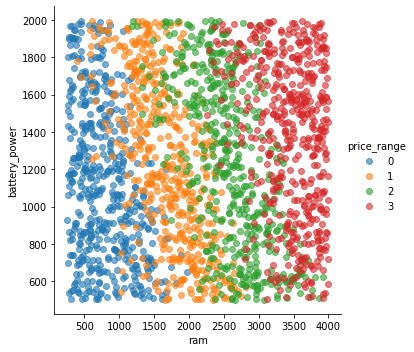

In [77]:
visualization_ram_battery_price(X, log.predict(mm.transform(X)))

### Randomforest

In [78]:
para_grid = {
    'n_estimators': [30, 50, 70, 90, 100, 200],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth' : [2, 3, 4, 5, 6, 7],
    'max_features' : ['sqrt', 'log2', None]
}

clf = GridSearchCV(estimator=RandomForestClassifier(), param_grid=para_grid, n_jobs=-1, cv=10)
clf.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 3, 4, 5, 6, 7],
                         'max_features': ['sqrt', 'log2', None],
                         'n_estimators': [30, 50, 70, 90, 100, 200]})

In [79]:
print('the best parameter: ', clf.best_params_)

the best parameter:  {'criterion': 'log_loss', 'max_depth': 7, 'max_features': 'sqrt', 'n_estimators': 30}


In [80]:
# create randomforest classifier model
clf_rdf = RandomForestClassifier(**clf.best_params_)
# Training model
clf_rdf.fit(X_train, y_train)

RandomForestClassifier(criterion='log_loss', max_depth=7, n_estimators=30)

In [81]:
calculate_accuracy(X_train, y_train, X_test, y_test, clf_rdf)

Average accuracy:  0.887857142857143 +/- 0.09327105550983311
--------------------------------------------------
The training predictions accuracy: 0.9821428571428571
The testing predictions accuracy: 0.9066666666666666
Confusion matrix
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       151
           1       0.88      0.88      0.88       146
           2       0.85      0.86      0.86       148
           3       0.95      0.92      0.93       155

    accuracy                           0.91       600
   macro avg       0.91      0.91      0.91       600
weighted avg       0.91      0.91      0.91       600



In [82]:
# model có hiện tượng overfiting

### SVC

In [83]:
para_grid = {
    'kernel' : ['linear', 'rbf', 'sigmoid']
    }

clf = GridSearchCV(estimator=SVC(), param_grid=para_grid, cv=10, n_jobs=-1)
clf.fit(X_train, y_train)

print('the best parameter: ', clf.best_params_)

the best parameter:  {'kernel': 'linear'}


In [84]:
# create randomforest classifier model
clf_scv = SVC(**clf.best_params_)
# Training model
clf_scv.fit(X_train, y_train)

SVC(kernel='linear')

In [85]:
calculate_accuracy(X_train, y_train, X_test, y_test, clf_scv)

Average accuracy:  0.9471428571428572 +/- 0.06358346595505111
--------------------------------------------------
The training predictions accuracy: 0.9514285714285714
The testing predictions accuracy: 0.955
Confusion matrix
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       151
           1       0.91      0.99      0.95       146
           2       0.94      0.91      0.92       148
           3       0.97      0.95      0.96       155

    accuracy                           0.95       600
   macro avg       0.96      0.96      0.95       600
weighted avg       0.96      0.95      0.96       600



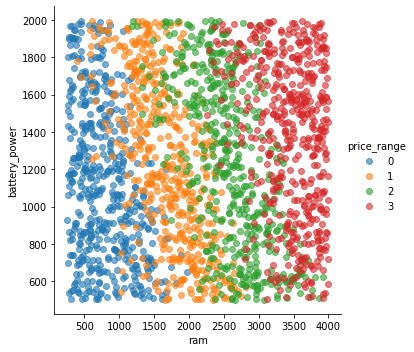

In [86]:
visualization_ram_battery_price(X, clf_scv.predict(mm.transform(X)))

### Conclusion
Cả hai model SVC và Logistic Regression điều có độ chính xác cao.

Trong thực tế SVC cần nhiều chi phí thực hiện hơn nên ta sẽ ưu tiên lựa chọn Logistic Regression trong trường hợp này